Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

In [8]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
# !git clone https://gitee.com/sculqy/dip_low_dose_-ct.git
# !mv dip_low_dose_-ct/* ./

'\n*Uncomment if running on colab* \nSet Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab \n'

In [ ]:
#choosing parameters: ct_name, NET_FLAG

# Import libs

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from utils.denoising_utils import *
from skimage.metrics import structural_similarity as ssim

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

# Set CT image path

In [ ]:
# path of full and low dose CT images
ct_name = 'C002_200'
full_dose_path = 'images_npy/' + ct_name + '_full.npy'
low_dose_path = 'images_npy/' + ct_name + '_low.npy'

# Load CT image

In [ ]:
# load numpy images. 
# C x W x H, np.float32, range from 0 to 1
img_np = np.load(full_dose_path)[None, :].astype(np.float32) / 4095.
img_noisy_np = np.load(low_dose_path)[None, :].astype(np.float32) / 4095.

if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);

# Setup

In [15]:
NET_FLAG = None # choose which net to use. 0 for snail, 1 for plane

INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

if NET_FLAG == 0:
    num_iter = 10000
    input_depth = 3
    figsize = 5 
    
    net = skip(
                input_depth, 1, 
                num_channels_down = [8, 16, 32, 64, 128], 
                num_channels_up   = [8, 16, 32, 64, 128],
                num_channels_skip = [0, 0, 0, 4, 4], 
                upsample_mode='bilinear',
                need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

    net = net.type(dtype)

elif NET_FLAG == 1:
    num_iter = 10000
    input_depth = 32 
    figsize = 4 
    
    
    net = get_net(input_depth, 'skip', pad,
                  n_channels=1,
                  skip_n33d=128, 
                  skip_n33u=128, 
                  skip_n11=4, 
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)

else:
    assert False
    
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831
Sequential(
  (1): Concat(
    (0): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((0, 0, 0, 0))
        (1): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
      )
      (2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace)
    )
    (1): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 128, kernel_size=(3, 3), stride=(2, 2))
      )
      (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace)
      (4): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.2, inplace)
      (7): Sequential(
        (1): Concat(
          (0): Seq

D:\anaconda3\envs\deep-image-prior\lib\site-packages\torch\nn\modules\upsampling.py:122: UserWarning: nn.Upsampling is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.Upsampling is deprecated. Use nn.functional.interpolate instead.")
D:\anaconda3\envs\deep-image-prior\lib\site-packages\torch\nn\functional.py:1961: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


# Optimize

Starting optimization with ADAM


D:\anaconda3\envs\deep-image-prior\lib\site-packages\ipykernel_launcher.py:27: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
D:\anaconda3\envs\deep-image-prior\lib\site-packages\ipykernel_launcher.py:28: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
D:\anaconda3\envs\deep-image-prior\lib\site-packages\ipykernel_launcher.py:29: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


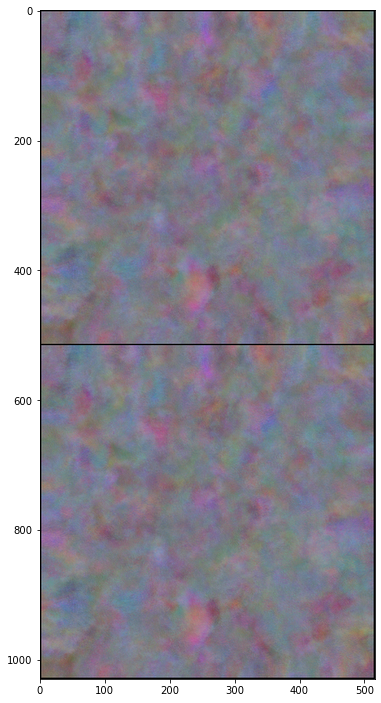

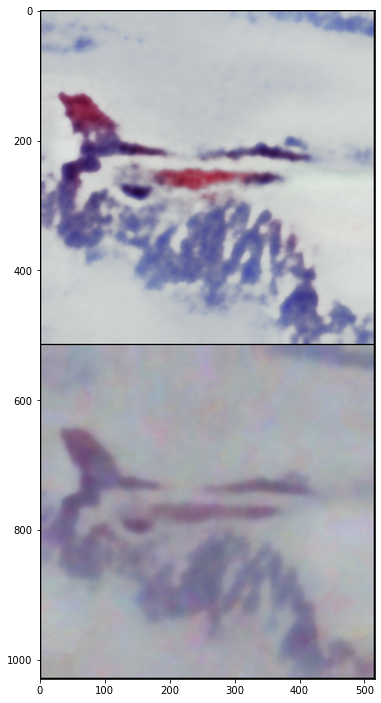

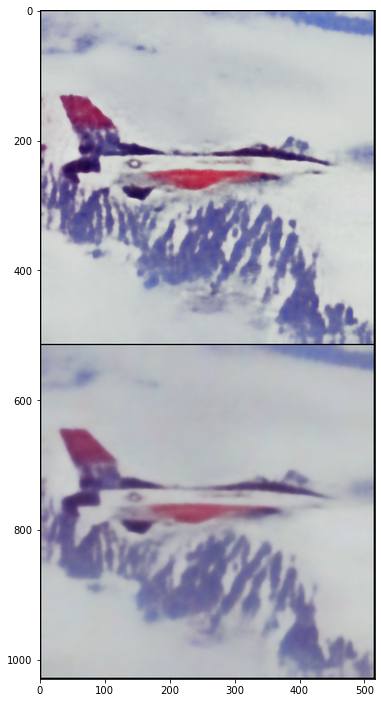

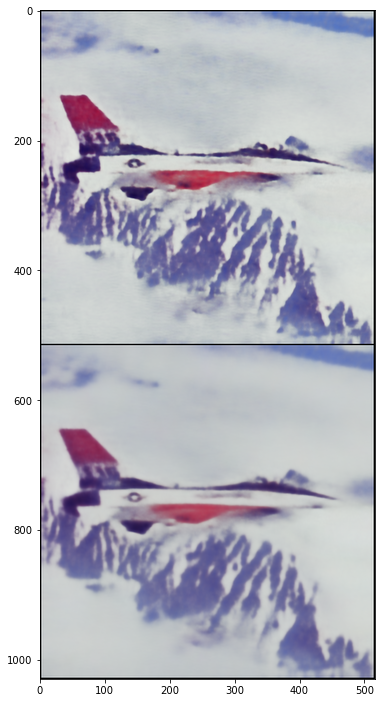

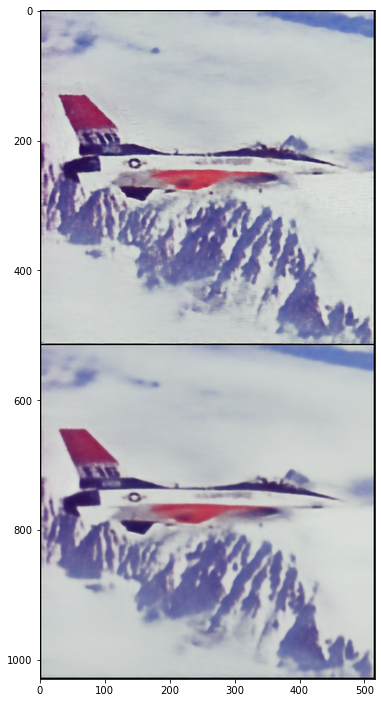

...

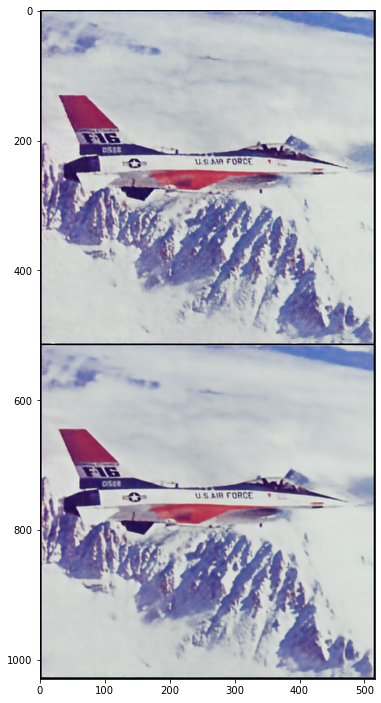

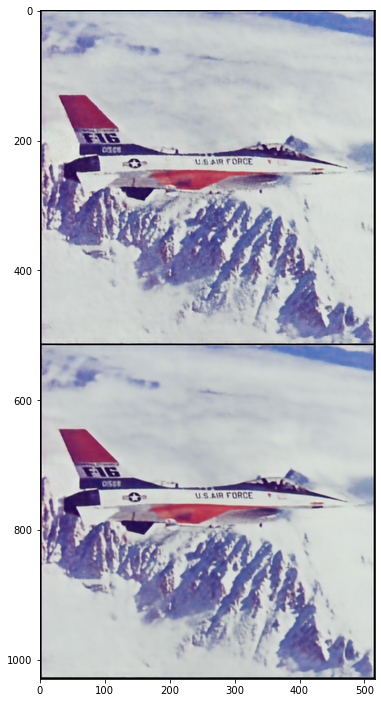

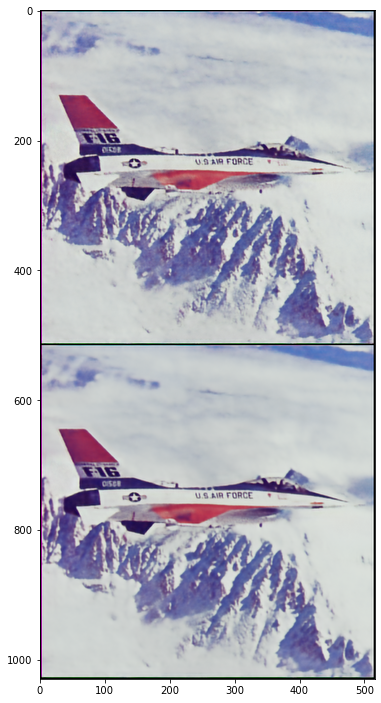

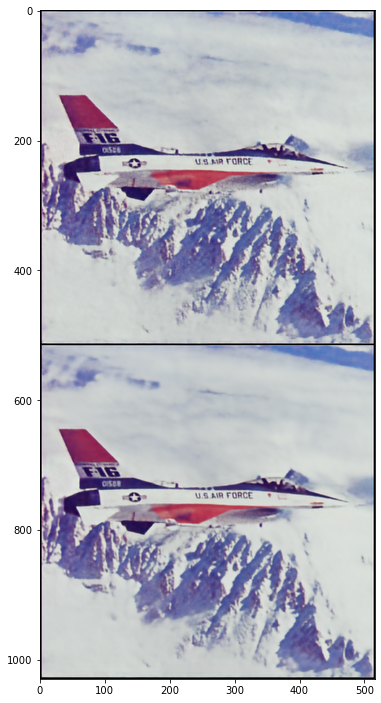

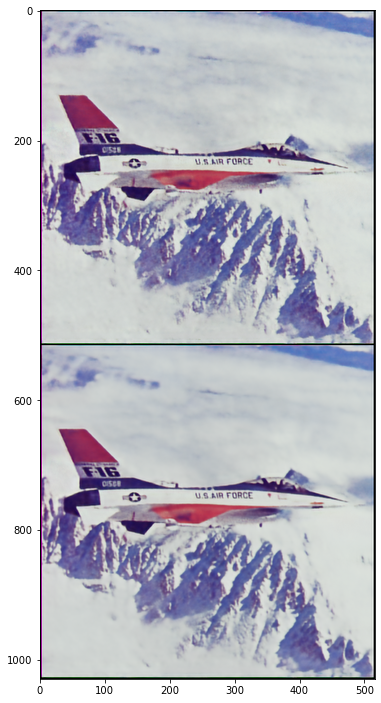

In [16]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None

psnr_noisy_last = 0
psnr_noisy_list = []
psnr_gt_list = []
psnr_gt_sm_list = []

ssim_noisy_last = 0
ssim_noisy_list = []
ssim_gt_list = []
ssim_gt_sm_list = []

loss_list = []
i = 0
def closure():
    
    global i, out_avg, psnr_noisy_last, ssim_noisy_lastlast_net, net_input, psnr_noisy_list, psnr_gt_list, psnr_gt_sm_list, ssim_noisy_list, ssim_gt_list, ssim_gt_sm_list, loss_list
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psnr_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psnr_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psnr_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 

    ssim_noisy = ssim(img_noisy_np, out.detach().cpu().numpy()[0], data_range=1.)
    ssim_gt = ssim(img_np, out.detach().cpu().numpy()[0], data_range=1.)
    ssim_gt_sm = ssim(img_np, out_avg.detach().cpu().numpy()[0], data_range=1.)
    
    # Record the intermediate data
    psnr_noisy_list.append(psnr_noisy)
    psnr_gt_list.append(psnr_gt)
    psnr_gt_sm_list.append(psnr_gt_sm)

    ssim_noisy_list.append(ssim_noisy)
    ssim_gt_list.append(ssim_gt)
    ssim_gt_sm_list.append(ssim_gt_sm)

    loss_list.append(Loss.detach().cpu().numpy)
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psnr_noisy, psnr_gt, psnr_gt_sm))
        np.save('output/' + ct_name + str(i) + '.npy',out_np[0])
        
        
    
    # Backtracking
    if i % show_every:
        if psnr_noisy - psnr_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psnr_noisy_last = psnr_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

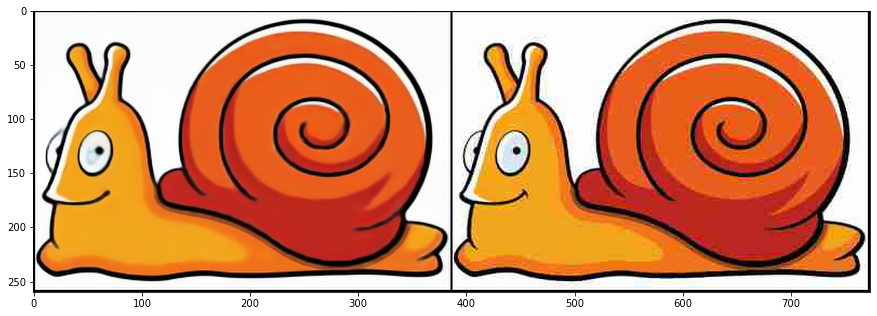

In [7]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);

In [ ]:
data = {'psnr_avg_list':psnr_avg_list, 'psnr_net_list':psnr_net_list, 'psnr_noisy_list':psnr_noisy_list, \
        'ssim_avg_list':ssim_avg_list, 'ssim_net_list':ssim_net_list, 'ssim_noisy_list':ssim_noisy_list, \
        'loss':loss_list}
np.save('DIP_' + ct_name,data)